In [8]:
# importing libraries

# For API
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

# For Automation
import csv
import os 
from time import time
from time import sleep

# For Visualization
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [10]:
# For API Testing Purposes

# url = 'https://sandbox-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
# Be sure to replace the API Key in sample code with your own and use API domain pro-api.coinmarketcap.com

url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'

parameters = {
  'start':'1',
  'limit': '1000', # '5000', # '15' , specify nb of data rows
  'convert':'USD'
} 
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': 'c0496f95-718d-4c80-90ed-5a90ee2e936f'
   # we changed key to be able to use the 333/day credits we have'b54bcf4d-1bca-4e8e-9a24-22ff2c3d462c',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)

#NOTE:
# I had to go in and put "jupyter notebook --NotebookApp.iopub_data_rate_limit=1e10"
# Into the Anaconda Prompt to change this to allow to pull data

# If that didn't work try using the local host URL 


{'status': {'timestamp': '2023-11-01T08:53:40.942Z', 'error_code': 0, 'error_message': None, 'elapsed': 29, 'credit_count': 5, 'notice': None, 'total_count': 8816}, 'data': [{'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'slug': 'bitcoin', 'num_market_pairs': 10515, 'date_added': '2010-07-13T00:00:00.000Z', 'tags': ['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'para

In [11]:
type(data)

dict

In [12]:
# For displaying Purposes: To display full dataset
pd.set_option('display.max.columns',None)
pd.set_option('display.max.rows',None)

In [13]:
# For Testing Purposes

df = pd.json_normalize(data['data'])
df['timestamp'] = pd.to_datetime('now')
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10515,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",2.100000e+07,1.953004e+07,1.953004e+07,False,NaN,1,NaN,NaN,NaN,2023-11-01T08:52:00.000Z,3.446071e+04,1.435697e+10,-18.0171,-0.091041,0.202804,1.634425,2.158302e+01,3.360807e+01,1.867491e+01,6.730190e+11,52.8003,7.236750e+11,NaN,2023-11-01T08:52:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:53:56.403533
1,1027,Ethereum,ETH,ethereum,7673,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,1.202693e+08,1.202693e+08,True,NaN,2,NaN,NaN,NaN,2023-11-01T08:52:00.000Z,1.805958e+03,6.528958e+09,-11.2755,-0.138756,0.291862,1.915330,4.018166e+00,1.068384e+01,-1.215950e+00,2.172013e+11,17.0373,2.172013e+11,NaN,2023-11-01T08:52:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:53:56.403533
2,825,Tether USDt,USDT,tether,64831,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,8.480671e+10,8.762562e+10,True,NaN,3,NaN,NaN,NaN,2023-11-01T08:51:00.000Z,1.000292e+00,2.789157e+10,-7.5848,0.015984,-0.013844,0.024362,-7.515230e-03,5.808164e-02,1.340664e-01,8.483145e+10,6.6553,8.765119e+10,NaN,2023-11-01T08:51:00.000Z,1027.0,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-11-01 10:53:56.403533
3,1839,BNB,BNB,bnb,1711,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,1.517036e+08,1.517036e+08,False,NaN,4,NaN,NaN,NaN,2023-11-01T08:51:00.000Z,2.248025e+02,3.069542e+08,7.6629,-0.033812,-1.115353,-0.125835,1.941631e+00,5.049011e+00,-5.835749e+00,3.410334e+10,2.6755,3.410334e+10,NaN,2023-11-01T08:51:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:53:56.403533
4,52,XRP,XRP,xrp,1126,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",1.000000e+11,5.356051e+10,9.998833e+10,False,NaN,5,NaN,NaN,NaN,2023-11-01T08:52:00.000Z,6.000606e-01,2.320697e+09,39.3527,-0.291893,4.856399,9.714625,1.459808e+01,2.093918e+01,-9.179753e+00,3.213955e+10,2.5210,6.000606e+10,NaN,2023-11-01T08:52:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:53:56.403533
5,3408,USDC,USDC,usd-coin,14725,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,2.474118e+10,2.474118e+10,False,NaN,6,NaN,NaN,NaN,2023-11-01T08:51:00.000Z,1.000011e+00,3.364912e+09,-11.9337,0.007316,-0.004998,0.003155,-7.393480e-03,-1.890290e-03,1.561654e-02,2.474146e+10,1.9407,2.474146e+10,NaN,2023-11-01T08:51:00.000Z,1027.0,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-11-01 10:53:56.403533
6,5426,Solana,SOL,solana,539,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,4.194414e+08,5.614259e+08,True,NaN,7,NaN,NaN,NaN,2023-11-01T08:52:00.000Z,3.855612e+01,1.517312e+09,9.9661,-0.745435,6.628211,23.053411,5.867410e+01,9.707441e+01,7.039142e+01,1.617203e+10,1.2685,2.164640e+10,NaN,2023-11-01T08:52:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:53:56.403533
7,2010,Cardano,ADA,cardano,956,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",4.500000e+10,3.524868e+10,3.630504e+10,False,NaN,8,NaN,NaN,NaN,2023-11-01T08:51:00.000Z,2.875061e-01,3.244682e+08,33.3638,-0.173863,-3.817621,3.042071,7.781897e+00,1.267125e+01,-2.258200e+00,1.013421e+10,0.7951,1.293777e+10,NaN,2023-11-01T08:51:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:53:56.403533
8,74,Dogecoin,DOGE,dogecoin,81

In [14]:
def api_runner():
    
    global df
    
    url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'

    parameters = {
      'start':'1',
      'limit': '1000', #'5000', #'15', specify nb of data rows
      'convert':'USD'
    } 
    headers = {
      'Accepts': 'application/json',
      'X-CMC_PRO_API_KEY': 'c0496f95-718d-4c80-90ed-5a90ee2e936f'
    }

    session = Session()
    session.headers.update(headers)

    try:
      response = session.get(url, params=parameters)
      data = json.loads(response.text)
      # print(data)
    except (ConnectionError, Timeout, TooManyRedirects) as e:
      print(e)
    
    df2 = pd.json_normalize(data['data'])
    df2['timestamp'] = pd.to_datetime('now')
    
    # To append df2 to df
    df = pd.concat([df,df2], ignore_index = True)
    
    # To create a csv file & append data into it
    if not os.path.isfile(r'C:\Users\Nagham\Desktop\Data Analytics Bootcamp\Python\API.csv'):
        df.to_csv(r'C:\Users\Nagham\Desktop\Data Analytics Bootcamp\Python\API.csv' , header = 'column_names' )
    else:
        df.to_csv(r'C:\Users\Nagham\Desktop\Data Analytics Bootcamp\Python\API.csv' , mode = 'a' , header = False)


In [15]:
# To automate the process of pulling data from API & adding to csv file

while(True):
    api_runner()
    print('API Runner Completed!')
    sleep(60)
exit()

API Runner Completed!


KeyboardInterrupt: 

In [ ]:
# Reading from the csv file created
csv_file = pd.read_csv(r'C:\Users\Nagham\Desktop\Data Analytics Bootcamp\Python\API.csv')
csv_file

In [38]:
# To view the numbers in a better way
pd.set_option('display.float.format' , lambda x: '%.5f' % x)

df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10515,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19529925.00000,19529925.00000,False,NaN,1,NaN,NaN,NaN,2023-11-01T08:00:00.000Z,34456.09779,14864833637.74963,-14.16980,0.10795,0.86699,1.73585,21.70528,33.59952,18.74475,672925005560.55237,52.74570,723578053513.85999,NaN,2023-11-01T08:00:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:03:59.261118
1,1027,Ethereum,ETH,ethereum,7673,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120269303.18923,120269303.18923,True,NaN,2,NaN,NaN,NaN,2023-11-01T07:59:00.000Z,1805.15553,6668868955.73395,-13.44790,0.06457,0.78594,1.98673,4.32264,10.63657,-1.42368,217104798307.20898,17.01730,217104798307.20999,NaN,2023-11-01T07:59:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:03:59.261118
2,825,Tether USDt,USDT,tether,64830,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,84806706137.39580,87625615023.84708,True,NaN,3,NaN,NaN,NaN,2023-11-01T07:59:00.000Z,1.00032,28476271206.31314,-5.46880,0.00353,-0.01112,0.02679,-0.00634,0.05501,0.13423,84833599810.78178,6.65280,87653402622.00000,NaN,2023-11-01T07:59:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-11-01 10:03:59.261118
3,1839,BNB,BNB,bnb,1711,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,151703597.00657,151703597.00657,False,NaN,4,NaN,NaN,NaN,2023-11-01T07:59:00.000Z,224.74980,314318254.20012,9.70400,0.06151,-0.66413,-0.10683,2.29508,4.87877,-6.09533,34095353112.76521,2.67250,34095353112.77000,NaN,2023-11-01T07:59:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:03:59.261118
4,52,XRP,XRP,xrp,1126,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,53560508378.00000,99988331658.00000,False,NaN,5,NaN,NaN,NaN,2023-11-01T08:00:00.000Z,0.60054,2305008560.34182,41.25190,1.73849,5.54783,10.32459,14.86118,20.98362,-10.40814,32165060628.23794,2.52240,60053688066.65000,NaN,2023-11-01T08:00:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:03:59.261118
5,3408,USDC,USDC,usd-coin,14725,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,24746953084.96940,24746953084.96940,False,NaN,6,NaN,NaN,NaN,2023-11-01T07:59:00.000Z,1.00005,3444976730.21034,-10.45240,0.00417,-0.00520,0.00392,-0.02363,-0.01261,0.01760,24748297708.38750,1.94080,24748297708.39000,NaN,2023-11-01T07:59:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-11-01 10:03:59.261118
6,5426,Solana,SOL,solana,539,2020-04-10T00:00:00.000Z,"[pos, platform, solana-ecosystem, cms-holdings...",NaN,419441454.44033,561425974.33105,True,NaN,7,NaN,NaN,NaN,2023-11-01T07:59:00.000Z,38.68399,1496684001.01142,3.44700,1.29376,8.27960,24.86695,59.09297,97.68718,70.33781,16225669394.20785,1.27240,21718197265.39000,NaN,2023-11-01T07:59:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01 10:03:59.261118
7,2010,Cardano,ADA,cardano,956,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,35248686173.15700,36305036712.02000,False,NaN,8,NaN,NaN,NaN,2023-11-01T07:59:00.000Z,0.28778,327692972.46938,37.44000,0.20129,-3.19227,3.34233,8.31197,12.58810,-2.49384,10143942104.15381,0.79550,12950196000.06000,NaN,2023-11-01T07:59:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-11-01

In [39]:
# Group by name

df_groupedBy_names = df.groupby('name' , sort = False)[['quote.USD.percent_change_1h','quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d']].mean()
df_groupedBy_names

,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d
name,,,,,,
Bitcoin,0.09783,0.89844,1.73436,21.69291,33.64888,18.65444
Ethereum,0.06847,0.84180,2.04506,4.29080,10.67077,-1.44804
Tether USDt,-0.00219,-0.02479,0.00916,-0.00000,0.04541,0.11507
BNB,-0.00023,-0.66861,-0.12315,2.13458,4.87154,-6.03664
XRP,1.28789,5.54005,10.18547,14.72098,20.81836,-10.25322
USDC,-0.00230,-0.01022,-0.00403,-0.01058,-0.01600,0.00338
Solana,0.37120,7.21595,23.43141,57.70001,95.69868,68.91509
Cardano,-0.03008,-3.35325,3.16916,7.94870,12.42769,-2.60039
Dogecoin,-0.18580,-2.43310,2.40752,5.38688,5.41121,-9.57573


In [11]:
# df_groupedBy_names viewed as series

df_series = df_groupedBy_names.stack()
df_series

name                                            
Bitcoin             quote.USD.percent_change_1h      0.23563
                    quote.USD.percent_change_24h     0.96546
                    quote.USD.percent_change_7d      1.88380
                    quote.USD.percent_change_30d    21.83004
                    quote.USD.percent_change_60d    33.70966
                    quote.USD.percent_change_90d    18.88697
Ethereum            quote.USD.percent_change_1h      0.29732
                    quote.USD.percent_change_24h     0.88399
                    quote.USD.percent_change_7d      2.29183
                    quote.USD.percent_change_30d     4.49315
                    quote.USD.percent_change_60d    10.81855
                    quote.USD.percent_change_90d    -1.26103
Tether USDt         quote.USD.percent_change_1h     -0.02800
                    quote.USD.percent_change_24h    -0.04257
                    quote.USD.percent_change_7d     -0.00582
                    quote.USD.percen

In [12]:
type(df_series)

pandas.core.series.Series

In [13]:
# Convert this series into dataframe

series_into_df = df_series.to_frame(name = 'values')
series_into_df

values
name                                                     
Bitcoin            quote.USD.percent_change_1h    0.23563
                   quote.USD.percent_change_24h   0.96546
                   quote.USD.percent_change_7d    1.88380
                   quote.USD.percent_change_30d  21.83004
                   quote.USD.percent_change_60d  33.70966
                   quote.USD.percent_change_90d  18.88697
Ethereum           quote.USD.percent_change_1h    0.29732
                   quote.USD.percent_change_24h   0.88399
                   quote.USD.percent_change_7d    2.29183
                   quote.USD.percent_change_30d   4.49315
                   quote.USD.percent_change_60d  10.81855
                   quote.USD.percent_change_90d  -1.26103
Tether USDt        quote.USD.percent_change_1h   -0.02800
                   quote.USD.percent_change_24h  -0.04257
                   quote.USD.percent_change_7d   -0.00582
                   quote.USD.percent_change_30d  -0.01086
                   quote.USD.percent_change_60d   0.04828
                   quote.USD.percent_change_90d   0.11563
BNB                quote.USD.percent_change_1h    0.12507
                   quote.USD.percent_change_24h  -0.64347
                   quote.USD.percent_change_7d    0.06843
                   quote.USD.percent_change_30d   2.29474
                   quote.USD.percent_change_60d   4.90765
                   quote.USD.percent_change_90d  -6.08375
XRP                quote.USD.percent_change_1h    1.91616
                   quote.USD.percent_change_24h   5.57934
                   quote.USD.percent_change_7d   10.60100
                   quote.USD.percent_change_30d  15.29475
                   quote.USD.percent_change_60d  21.19378
                   quote.USD.percent_change_90d -10.29170
USDC               quote.USD.percent_change_1h   -0.00575
                   quote.USD.percent_change_24h  -0.02036
                   quote.USD.percent_change_7d   -0.00728
                   quote.USD.percent_change_30d  -0.01529
                   quote.USD.percent_change_60d  -0.01650
                   quote.USD.percent_change_90d   0.00362
Solana             quote.USD.percent_change_1h    1.63286
                   quote.USD.percent_change_24h   8.73357
                   quote.USD.percent_change_7d   25.46703
                   quote.USD.percent_change_30d  59.41185
                   quote.USD.percent_change_60d  98.38540
                   quote.USD.percent_change_90d  71.04011
Cardano            quote.USD.percent_change_1h    0.34372
                   quote.USD.percent_change_24h  -3.19312
                   quote.USD.percent_change_7d    3.57208
                   quote.USD.percent_change_30d   8.56610
                   quote.USD.percent_change_60d  12.65246
                   quote.USD.percent_change_90d  -2.49219
Dogecoin           quote.USD.percent_change_1h   -0.06871
                   quote.USD.percent_change_24h  -2.43704
                   quote.USD.percent_change_7d    2.77921
                   quote.USD.percent_change_30d   5.57092
                   quote.USD.percent_change_60d   5.45743
                   quote.USD.percent_change_90d  -9.61889
TRON               quote.USD.percent_change_1h    0.41507
                   quote.USD.percent_change_24h   1.63895
                   quote.USD.percent_change_7d    5.57891
                   quote.USD.percent_change_30d   8.45513
                   quote.USD.percent_change_60d  27.95434
                   quote.USD.percent_change_90d  27.72954
Toncoin            quote.USD.percent_change_1h   -0.43641
                   quote.USD.percent_change_24h   1.35826
                   quote.USD.percent_change_7d    1.92252
                   quote.USD.percent_change_30d   2.47449
                   quote.USD.percent_change_60d  12.53707
                   quote.USD.percent_change_90d  81.19774
Chainlink          quote.USD.percent_change_1h    0.74267
                   quote.USD.percent_change_24h  

In [14]:
type(series_into_df)

pandas.core.frame.DataFrame

In [15]:
# We don't want the names to be the index we want it as integers

int_indexed_df = series_into_df.reset_index()
int_indexed_df

,name,level_1,values
0,Bitcoin,quote.USD.percent_change_1h,0.23563
1,Bitcoin,quote.USD.percent_change_24h,0.96546
2,Bitcoin,quote.USD.percent_change_7d,1.88380
3,Bitcoin,quote.USD.percent_change_30d,21.83004
4,Bitcoin,quote.USD.percent_change_60d,33.70966
5,Bitcoin,quote.USD.percent_change_90d,18.88697
6,Ethereum,quote.USD.percent_change_1h,0.29732
7,Ethereum,quote.USD.percent_change_24h,0.88399
8,Ethereum,quote.USD.percent_change_7d,2.29183
9,Ethereum,quote.USD.percent_change_30d,4.49315


In [16]:
# Change level_1 into a clearer name
int_indexed_df.rename(columns = {'level_1':'percent_change'} , inplace = True) 

In [17]:
int_indexed_df

,name,percent_change,values
0,Bitcoin,quote.USD.percent_change_1h,0.23563
1,Bitcoin,quote.USD.percent_change_24h,0.96546
2,Bitcoin,quote.USD.percent_change_7d,1.88380
3,Bitcoin,quote.USD.percent_change_30d,21.83004
4,Bitcoin,quote.USD.percent_change_60d,33.70966
5,Bitcoin,quote.USD.percent_change_90d,18.88697
6,Ethereum,quote.USD.percent_change_1h,0.29732
7,Ethereum,quote.USD.percent_change_24h,0.88399
8,Ethereum,quote.USD.percent_change_7d,2.29183
9,Ethereum,quote.USD.percent_change_30d,4.49315


In [18]:
# We want to pretify the above df 
int_indexed_df = int_indexed_df.replace(['quote.USD.percent_change_1h','quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d'],['1h','24h','7d','30d','60d','90d'])
int_indexed_df

,name,percent_change,values
0,Bitcoin,1h,0.23563
1,Bitcoin,24h,0.96546
2,Bitcoin,7d,1.88380
3,Bitcoin,30d,21.83004
4,Bitcoin,60d,33.70966
5,Bitcoin,90d,18.88697
6,Ethereum,1h,0.29732
7,Ethereum,24h,0.88399
8,Ethereum,7d,2.29183
9,Ethereum,30d,4.49315


In [19]:
# Visualizations

C:\Users\Nagham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


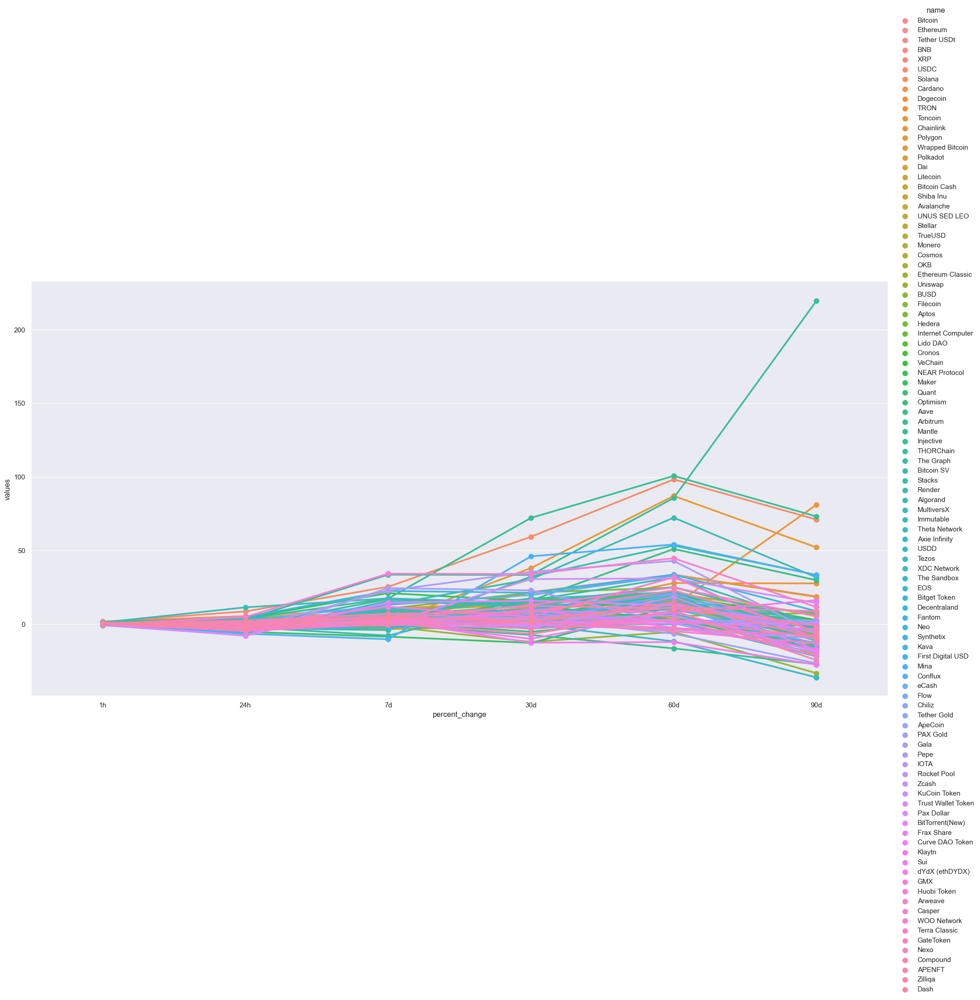

In [40]:
height = 10
aspect = 2
sns.catplot(x = 'percent_change' , y = 'values' , hue = 'name' , data = int_indexed_df , kind = 'point', height = height, aspect = aspect)

In [41]:
# Dataframe with specific columns
sp_df = df[['name','quote.USD.price','timestamp']]
sp_df

,name,quote.USD.price,timestamp
0,Bitcoin,34456.09779,2023-11-01 10:03:59.261118
1,Ethereum,1805.15553,2023-11-01 10:03:59.261118
2,Tether USDt,1.00032,2023-11-01 10:03:59.261118
3,BNB,224.74980,2023-11-01 10:03:59.261118
4,XRP,0.60054,2023-11-01 10:03:59.261118
5,USDC,1.00005,2023-11-01 10:03:59.261118
6,Solana,38.68399,2023-11-01 10:03:59.261118
7,Cardano,0.28778,2023-11-01 10:03:59.261118
8,Dogecoin,0.06693,2023-11-01 10:03:59.261118
9,TRON,0.09762,2023-11-01 10:03:59.261118


In [42]:
# we want to strict the data to bitcoin
bitcoin_df = sp_df.query("name == 'Bitcoin'")
bitcoin_df

,name,quote.USD.price,timestamp
0,Bitcoin,34456.09779,2023-11-01 10:03:59.261118
1000,Bitcoin,34458.13872,2023-11-01 10:05:00.054027
1100,Bitcoin,34458.57896,2023-11-01 10:06:01.415313
1200,Bitcoin,34454.86363,2023-11-01 10:07:03.271533
1300,Bitcoin,34454.87676,2023-11-01 10:08:04.689567
1400,Bitcoin,34466.46001,2023-11-01 10:38:36.688540


<Axes: xlabel='timestamp', ylabel='quote.USD.price'>

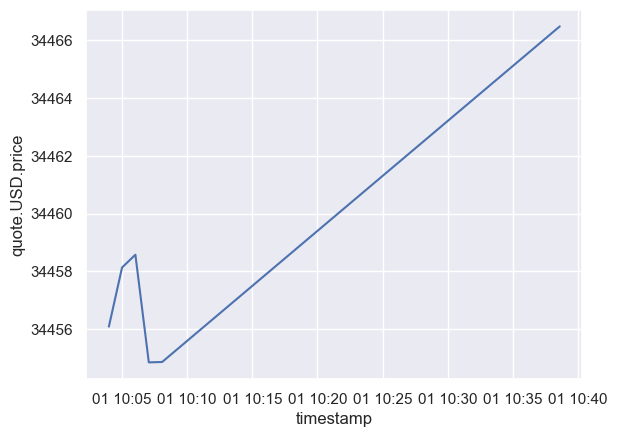

In [43]:
sns.set_theme(style = 'darkgrid')
sns.lineplot(x = 'timestamp' , y = 'quote.USD.price' , data = bitcoin_df)